In [1]:
import sys

sys.path.append('../')

import argparse
import numpy as np
import torch
import matplotlib.pyplot as plt
import os

import cnp.data

from cnp.experiment import (
    report_loss,
    generate_root,
    WorkingDirectory,
    save_checkpoint
)

from torch import nn
from cnp.utils import device
from torch.distributions import MultivariateNormal
from utils import sample_datasets_from_gps, plot_samples_and_predictions

In [2]:
# =============================================================================
# Fully Connected Neural Network
# =============================================================================


class FullyConnectedNetwork(nn.Module):
    
    def __init__(self,
                 input_dim,
                 output_dim,
                 hidden_dims,
                 nonlinearity):
        
        super().__init__()
        
        shapes = [input_dim] + hidden_dims + [output_dim]
        shapes = [(s1, s2) for s1, s2 in zip(shapes[:-1], shapes[1:])]
        
        self.W = []
        self.b = []
        self.num_linear = len(hidden_dims) + 1
        
        for shape in shapes:

            W = nn.Parameter(torch.randn(size=shape) / shape[0] ** 0.5)
            b = nn.Parameter(torch.randn(size=shape[1:]))

            self.W.append(W)
            self.b.append(b)
            
        self.W = torch.nn.ParameterList(self.W)
        self.b = torch.nn.ParameterList(self.b)
        
        self.nonlinearity = getattr(nn, nonlinearity)()
        
    
    def forward(self, tensor):
        
        for i, (W, b) in enumerate(zip(self.W, self.b)):
            
            tensor = torch.einsum('...i, ij -> ...j', tensor, W)
                
            tensor = tensor + b[(None,) * (len(tensor.shape) - 1)]
            
            if i < self.num_linear - 1:
                tensor = self.nonlinearity(tensor)
        
        return tensor


    
# =============================================================================
# Gaussian Neural Process
# =============================================================================
    
    
class GaussianNeuralProcess(nn.Module):
    
    def __init__(self,
                 encoder,
                 decoder,
                 log_noise):
        
        
        super().__init__()
        
        self.encoder = encoder
        self.decoder = decoder
        
        self.log_noise = torch.tensor(log_noise)
        self.log_noise = nn.Parameter(self.log_noise)
        
        
    def forward(self,
                ctx_in,
                ctx_out,
                trg_in):
        
        D = ctx_out.shape[-1]
        
        ctx = torch.cat([ctx_in, ctx_out], dim=-1)
        
        theta = self.encoder(ctx)
        theta = torch.mean(theta, dim=1)[:, None, :]
        theta = theta.repeat(1, trg_in.shape[1], 1)
        
        tensor = torch.cat([trg_in, theta], dim=-1)
        tensor = self.decoder(tensor)
        
        mean = tensor[:, :, :1]
        log_noise = tensor[:, :, D:(2*D)]
        
        cov_root = tensor[:, :, (2*D):]
        cov = torch.einsum('bni, bmi -> bnm', cov_root, cov_root) / cov_root.shape[-1]
        
        cov_plus_noise = cov + torch.exp(self.log_noise) * torch.eye(cov.shape[1])[None, ...]
                
        return mean, cov, cov_plus_noise
    
    
    def _loss(self,
              ctx_in,
              ctx_out,
              trg_in,
              trg_out):
        
        mean, cov, cov_plus_noise = self.forward(ctx_in, ctx_out, trg_in)
        
        pred_dist = MultivariateNormal(loc=mean[:, :, 0],
                                       covariance_matrix=cov_plus_noise)
        
        log_prob = pred_dist.log_prob(trg_out[:, :, 0])
        log_prob = torch.mean(log_prob)
        
        return - log_prob
    
    
    def loss(self,
             inputs,
             outputs,
             num_samples):
        
        loss = 0
        
        for i in range(num_samples):
            
            N = np.random.choice(np.arange(1, inputs.shape[1]))
            
            ctx_in = inputs[:, :N]
            ctx_out = outputs[:, :N]
            trg_in = inputs[:, N:]
            trg_out = outputs[:, N:]
            
            loss = loss + self._loss(ctx_in,
                                     ctx_out,
                                     trg_in,
                                     trg_out)
        
        loss = loss / (num_samples * inputs.shape[1])
        
        return loss


    
# =============================================================================
# Translation Equivariant Gaussian Neural Process
# =============================================================================

    
class TranslationEquivariantGaussianNeuralProcess(GaussianNeuralProcess):
    
    def __init__(self,
                 encoder,
                 decoder,
                 log_noise):
        
        
        super().__init__(encoder=encoder,
                         decoder=decoder,
                         log_noise=log_noise)
        
        
    def forward(self,
                ctx_in,
                ctx_out,
                trg_in):
        
        D = ctx_out.shape[-1]
        
        # Context and target inputs
        ctx_in = ctx_in[:, None, :, :]
        trg_in = trg_in[:, :, None, :]
        
        diff = ctx_in - trg_in
        
        ctx_out = ctx_out[:, None, :, :]
        ctx_out = ctx_out.repeat(1, diff.shape[1], 1, 1)
        
        ctx = torch.cat([diff, ctx_out], dim=-1)
        
        tensor = self.encoder(ctx)
        tensor = torch.mean(tensor, dim=2) # (B, T, R)
        
        tensor = self.decoder(tensor)
        
        mean = tensor[:, :, :1]
        cov_root = tensor[:, :, 1:]
        cov = torch.einsum('bni, bmi -> bnm', cov_root, cov_root) / cov_root.shape[-1]
        
        diag_noise = torch.exp(self.log_noise) * torch.eye(cov.shape[1])[None, :, :]
        cov_plus_noise = cov + diag_noise
                
        return mean, cov, cov_plus_noise

In [3]:
class Covariance(nn.Module):
    
    def __init__(self, num_basis_dim, extra_cov_dim):
        
        super().__init__()
        
        self.num_basis_dim = num_basis_dim
        self.extra_cov_dim = extra_cov_dim


class InnerProdCov(Covariance):
    
    def __init__(self, num_basis_dim):
        # Extra dimension to add to the output
        extra_cov_dim = 0
        super().__init__(num_basis_dim, extra_cov_dim)
        
    def forward(self, embeddings):
        # Compute the covariance by taking inner products between embeddings
        basis_emb = embeddings[:, :, :self.num_basis_dim]
        cov = torch.einsum('bni, bmi -> bnm', basis_emb, basis_emb) / self.num_basis_dim
        
        return cov
    
    

class AddNoise(nn.Module):
    def __init__(self, extra_noise_dim):
        
        super().__init__()
        
        self.extra_noise_dim = extra_noise_dim
        
        
class AddHomoNoise(AddNoise):
    def __init__(self):
        # Extra dimension to add to the output
        extra_noise_dim = 0
        super().__init__(extra_noise_dim)

        # Noise Parameters
        self.noise_scale = nn.Parameter(torch.zeros(1), requires_grad=True)
    
    def forward(self, cov, embeddings):
        noise_var = torch.eye(cov.shape[1])[None, ...]
        cov_plus_noise = cov + torch.exp(self.noise_scale) * noise_var
        
        return cov_plus_noise

In [4]:
class GaussianNeuralProcess(nn.Module):
    """Conditional Neural Process Module.

    Args:

    """
    def __init__(self, encoder, decoder, covariance, add_noise):
        
        super().__init__()
        
        self.encoder = encoder
        self.decoder = decoder
        self.covariance = covariance
        self.add_noise = add_noise

    
    def forward(self, x_context, y_context, x_target):
        
        r = self.encoder(x_context, y_context, x_target)
        z = self.decoder(r, x_context, y_context, x_target)
        
        # Produce mean
        mean = z[..., 0:1]
        
        # Produce cov
        embedding = z[..., 1:]
        cov = self.covariance(embedding)
        cov_plus_noise = self.add_noise(cov, embedding)
        
        return mean, cov, cov_plus_noise 
    
    
class StandardFullyConnectedTEGNP(GaussianNeuralProcess):
    
    def __init__(self, covariance, add_noise):
        
        input_dim = 1
        output_dim = 1
        rep_dim = 128
        embedding_dim = output_dim +               \
                        covariance.num_basis_dim + \
                        covariance.extra_cov_dim + \
                        add_noise.extra_noise_dim
        
        encoder = StandardFullyConnectedTEEncoder(input_dim=input_dim,
                                                  output_dim=output_dim,
                                                  rep_dim=rep_dim)
        
        decoder = StandardFullyConnectedTEDecoder(input_dim=input_dim,
                                                  output_dim=output_dim,
                                                  rep_dim=rep_dim,
                                                  embedding_dim=embedding_dim)
        
        super().__init__(encoder=encoder, 
                         decoder=decoder,
                         covariance=covariance,
                         add_noise=add_noise)
    
    
    def _loss(self,
              ctx_in,
              ctx_out,
              trg_in,
              trg_out):
        
        mean, cov, cov_plus_noise = self.forward(ctx_in, ctx_out, trg_in)
        
        pred_dist = MultivariateNormal(loc=mean[:, :, 0],
                                       covariance_matrix=cov_plus_noise)
        
        log_prob = pred_dist.log_prob(trg_out[:, :, 0])
        log_prob = torch.mean(log_prob)
        
        return - log_prob
    
    
    def loss(self,
             inputs,
             outputs,
             num_samples):
        
        loss = 0
        
        for i in range(num_samples):
            
            N = np.random.choice(np.arange(1, inputs.shape[1]))
            
            ctx_in = inputs[:, :N]
            ctx_out = outputs[:, :N]
            trg_in = inputs[:, N:]
            trg_out = outputs[:, N:]
            
            loss = loss + self._loss(ctx_in,
                                     ctx_out,
                                     trg_in,
                                     trg_out)
        
        loss = loss / (num_samples * inputs.shape[1])
        
        return loss
        
        
        
# =============================================================================
# Fully Connected Translation Equivariant Encoder
# =============================================================================


class FullyConnectedTEEncoder(nn.Module):
    
    def __init__(self, deepset):
        
        super().__init__()
        
        self.deepset = deepset
    
    
    def forward(self, x_ctx, y_ctx, x_trg):
        
        assert len(x_ctx.shape) == 3
        assert len(y_ctx.shape) == 3
        assert len(x_trg.shape) == 3
        
        # Compute context input pairwise differences
        x_diff = x_ctx[:, None, :, :] - x_ctx[:, :, None, :]
        
        # Tile context outputs to concatenate with input differences
        y_ctx_tile1 = y_ctx[:, None, :, :].repeat(1, x_diff.shape[1], 1, 1)
        y_ctx_tile2 = y_ctx[:, :, None, :].repeat(1, 1, x_diff.shape[2], 1)
        
        # Concatenate input differences and outputs, to obtain complete context
        ctx = torch.cat([x_diff, y_ctx_tile1, y_ctx_tile2], dim=-1)
        
        # Latent representation of context set -- resulting r has shape (B, C, R)
        r = self.deepset(ctx)
        
        return r
    

# =============================================================================
# Standard Translation Equivariant Encoder
# =============================================================================


class StandardFullyConnectedTEEncoder(FullyConnectedTEEncoder):
    
    def __init__(self,
                 input_dim,
                 output_dim,
                 rep_dim):
        
        # Input dimension of encoder (Din + 2 * Dout)
        element_input_dim = input_dim + 2 * output_dim
        
        # Sizes of hidden layers and nonlinearity type
        # Used for both elementwise and aggregate networks
        hidden_dims = [128, 128]
        nonlinearity = 'ReLU'
        
        # Element network -- in (B, C, C, Din + 2 * Dout), out (B, C, C, R)
        element_network = FullyConnectedNetwork(input_dim=element_input_dim,
                                                output_dim=rep_dim,
                                                hidden_dims=hidden_dims,
                                                nonlinearity=nonlinearity)
        
        # Dimensions to mean over -- in (B, C, C, R), out (B, R)
        aggregation_dims = [1]
        
        # Aggregate network -- in (B, R), out (B, R)
        aggregate_network = FullyConnectedNetwork(input_dim=rep_dim,
                                                  output_dim=rep_dim,
                                                  hidden_dims=hidden_dims,
                                                  nonlinearity=nonlinearity)
        
        # Deepset architecture
        deepset = FullyConnectedDeepSet(element_network,
                                        aggregation_dims,
                                        aggregate_network)
        
        super().__init__(deepset=deepset)
        
        
        
# =============================================================================
# Fully Connected Translation Equivariant Decoder
# =============================================================================


class FullyConnectedTEDecoder(nn.Module):
    
    def __init__(self):
        
        super().__init__()
    
    
    def forward(self, r, x_ctx, y_ctx, x_trg):
        
        """
        r     : (B, C, R)
        x_ctx : (B, C, Din)
        y_ctx : (B, C, Dout)
        x_ctx : (B, T, Din)
        """

        D = y_ctx.shape[-1]
        
        # Context and target inputs
        x_ctx = x_ctx[:, :, None, :]
        x_trg = x_trg[:, None, :, :]
        
        diff = x_ctx - x_trg
        
        y_ctx = y_ctx[:, :, None, :]
        y_ctx = y_ctx.repeat(1, 1, diff.shape[2], 1)
        
        r = r[:, :, None, :].repeat(1, 1, diff.shape[2], 1)
        
        ctx = torch.cat([diff, r, y_ctx], dim=-1) # (B, C, T, Din + R + Dout)
        
        tensor = self.deepset(ctx)
        
        return tensor
        
        

# =============================================================================
# Standard Translation Equivariant Decoder
# =============================================================================


class StandardFullyConnectedTEDecoder(FullyConnectedTEDecoder):
    
    def __init__(self,
                 input_dim,
                 output_dim,
                 rep_dim,
                 embedding_dim):
        
        super().__init__()
        
        # Input dimension of encoder (Din + R)
        element_input_dim = input_dim + output_dim + rep_dim
        
        # Sizes of hidden layers and nonlinearity type
        # Used for both elementwise and aggregate networks
        hidden_dims = [128, 128]
        nonlinearity = 'ReLU'
        
        # Element network -- in (B, C, T, Din + R), out (B, C, T, R)
        element_network = FullyConnectedNetwork(input_dim=element_input_dim,
                                                output_dim=rep_dim,
                                                hidden_dims=hidden_dims,
                                                nonlinearity=nonlinearity)
        
        # Dimensions to mean over -- in (B, C, T, R), out (B, T, R)
        aggregation_dims = [1]
        
        # Aggregate network -- in (B, T, R), out (B, T, E)
        aggregate_network = FullyConnectedNetwork(input_dim=rep_dim,
                                                  output_dim=embedding_dim,
                                                  hidden_dims=hidden_dims,
                                                  nonlinearity=nonlinearity)
        
        # Deepset architecture
        deepset = FullyConnectedDeepSet(element_network,
                                        aggregation_dims,
                                        aggregate_network)
        
        self.deepset = deepset

        
# =============================================================================
# Fully Connected DeepSet with mean aggregation
# =============================================================================
    
    
class FullyConnectedDeepSet(nn.Module):
    
    def __init__(self,
                 element_network,
                 aggregation_dims,
                 aggregate_network):

        super().__init__()
        
        assert type(aggregation_dims) == list
        
        self.element_network = element_network
        self.aggregation_dims = aggregation_dims
        self.aggregate_network = aggregate_network
        
    
    def forward(self, tensor):
        
        tensor = self.element_network(tensor)
        tensor = torch.mean(tensor, dim=self.aggregation_dims)
        tensor = self.aggregate_network(tensor)
        
        return tensor

In [10]:
# def validate(data, model, report_freq=None, std_error=False):
#     """
#     Compute the validation loss.
#     """
    
#     model.eval()
#     likelihoods = []
    
#     with torch.no_grad():
#         for step, task in enumerate(data):

#             mean, cov, cov_plus_noise = model(task['x_context'].float(),
#                                               task['y_context'].float(),
#                                               task['x_target'].float())

#             dist = MultivariateNormal(loc=mean[:, :, 0],
#                                       covariance_matrix=cov_plus_noise)
#             obj = - dist.log_prob(task['y_target'][:, :, 0]).sum()

#             likelihoods.append(obj.item())

#     likelihoods = np.array(likelihoods)
#     avg_ll = likelihoods.mean()
    
#     return avg_ll, task


def train(model,
          opt,
          xmin,
          xmax,
          num_batches,
          batch_size,
          scale,
          cov_coeff,
          noise_coeff,
          num_samples):
    
    inputs, outputs = sample_datasets_from_gps(xmin,
                                               xmax,
                                               num_batches,
                                               batch_size,
                                               scale,
                                               cov_coeff,
                                               noise_coeff,
                                               as_tensor=True)
    
    print(inputs.shape, outputs.shape)
    
    loss = model.loss(inputs, outputs, num_samples=num_samples)
    
    # Optimization
    loss.backward()
    opt.step()
    opt.zero_grad()

    return loss

In [11]:
num_train_tasks = 2
num_valid_tasks = 1
learning_rate = 1e-3
epochs = 1000000
num_basis_dim = 512

In [12]:
xmin = -3.
xmax = 3.
num_batches = 16
batch_size = 16
plot_batch_size = 8
scale = 1.
cov_coeff = 1e0
noise_coeff = 1e-1
num_samples = 2


Epoch: 1/1000000
Training        epoch 0: 3.934e-01


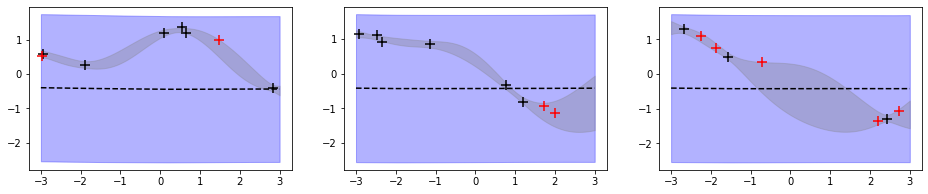


Epoch: 101/1000000
Training        epoch 100: 5.623e-01


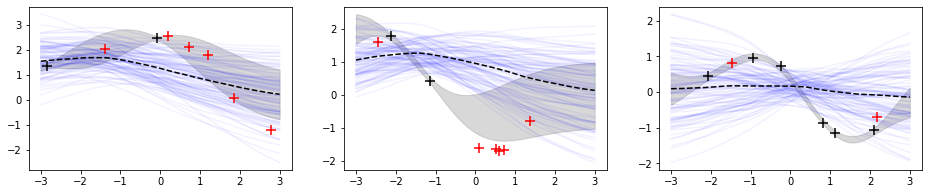


Epoch: 201/1000000
Training        epoch 200: 1.602e-01


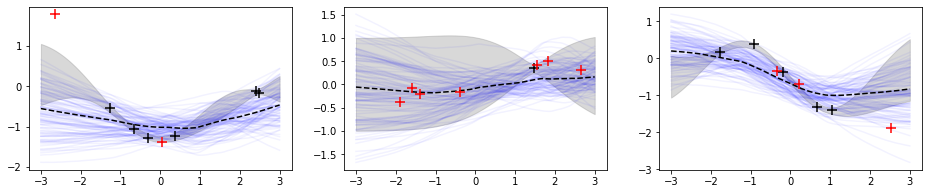


Epoch: 301/1000000
Training        epoch 300: 3.432e-01


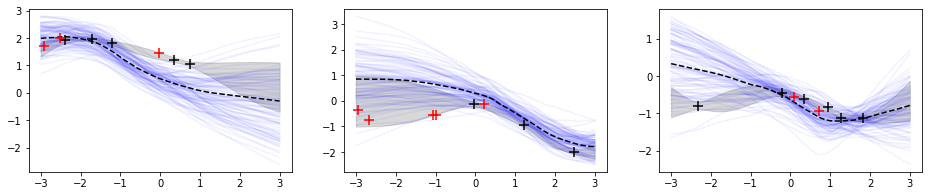


Epoch: 401/1000000
Training        epoch 400: 5.559e-01


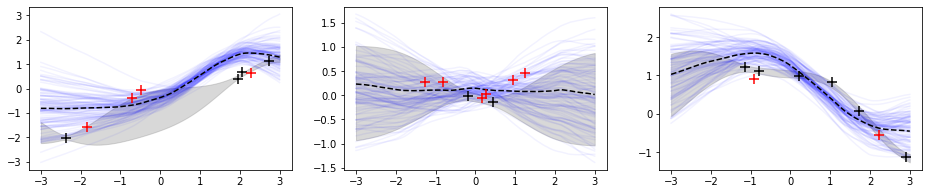


Epoch: 501/1000000
Training        epoch 500: 5.200e-01


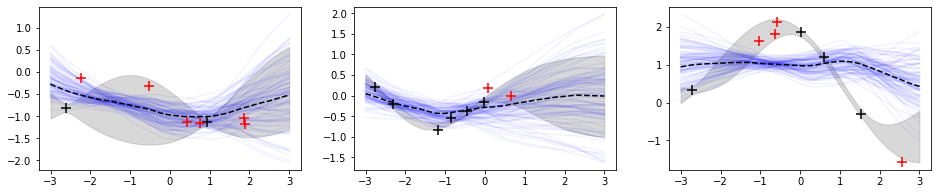


Epoch: 601/1000000
Training        epoch 600: 2.027e-01


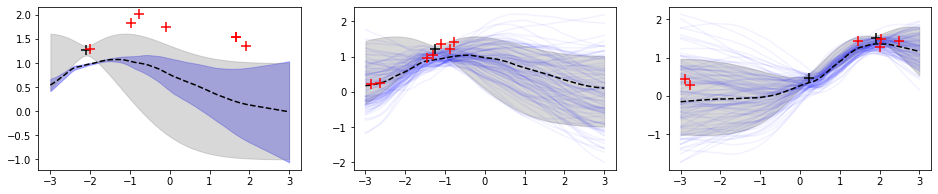


Epoch: 701/1000000
Training        epoch 700: 1.939e-01


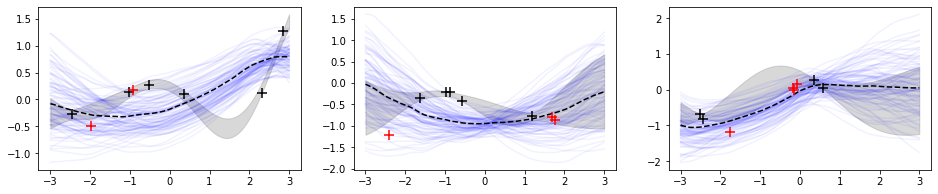


Epoch: 801/1000000
Training        epoch 800: 3.166e-01


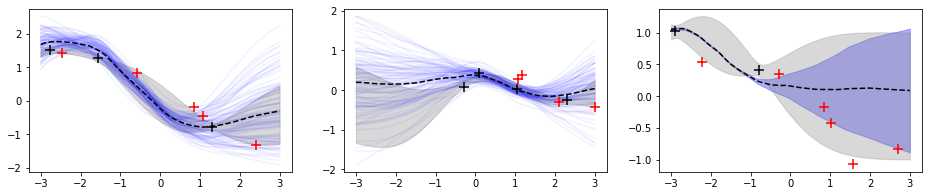


Epoch: 901/1000000
Training        epoch 900: 2.795e-01


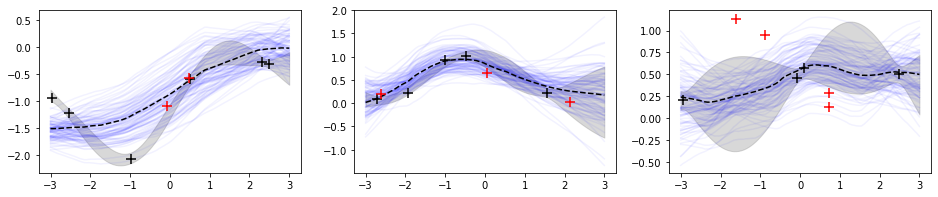


Epoch: 1001/1000000
Training        epoch 1000: 3.512e-01


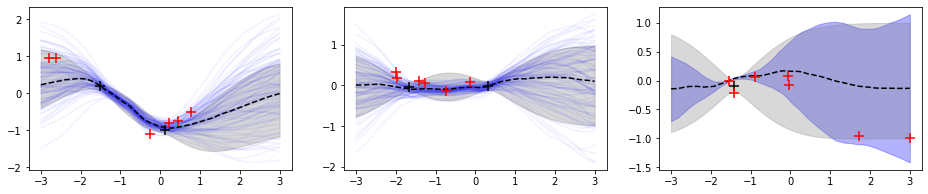


Epoch: 1101/1000000
Training        epoch 1100: 7.805e-02


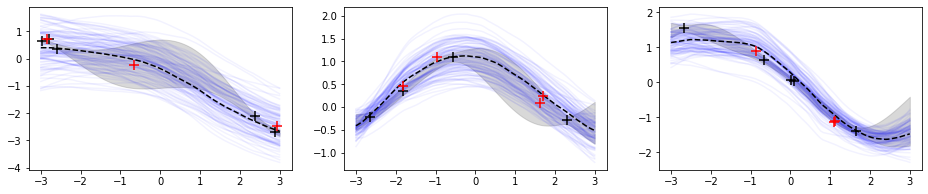


Epoch: 1201/1000000
Training        epoch 1200: 3.254e-01


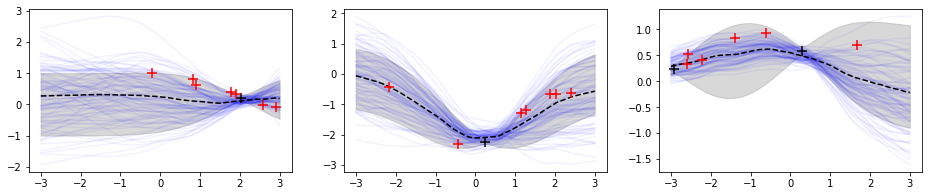


Epoch: 1301/1000000
Training        epoch 1300: 3.377e-01


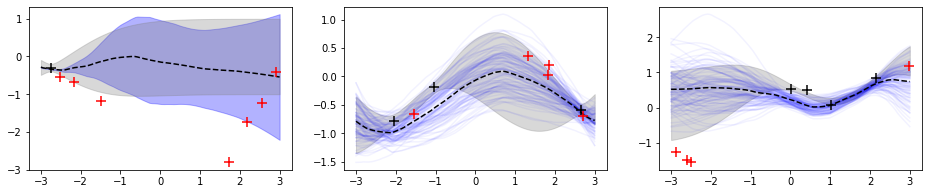


Epoch: 1401/1000000
Training        epoch 1400: 2.698e-01


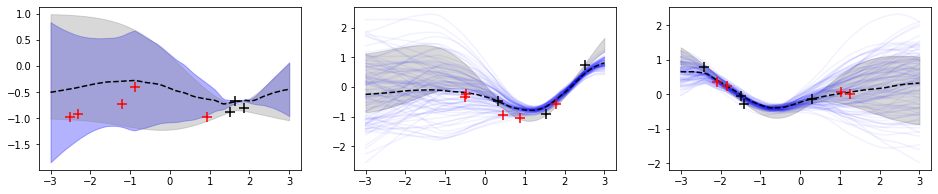


Epoch: 1501/1000000
Training        epoch 1500: 2.186e-01


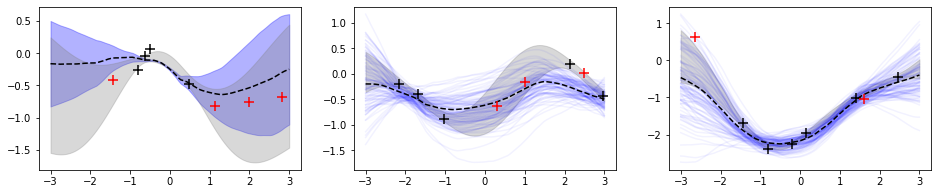


Epoch: 1601/1000000
Training        epoch 1600: 1.482e-01


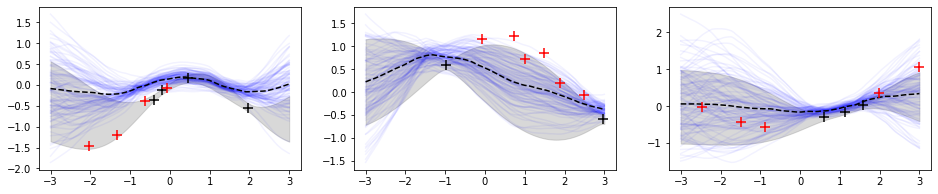


Epoch: 1701/1000000
Training        epoch 1700: 1.657e-01


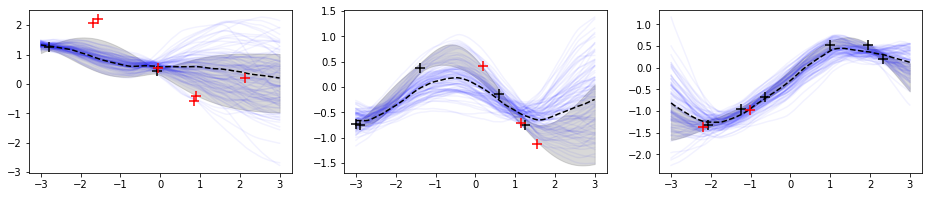


Epoch: 1801/1000000
Training        epoch 1800: 1.750e-01


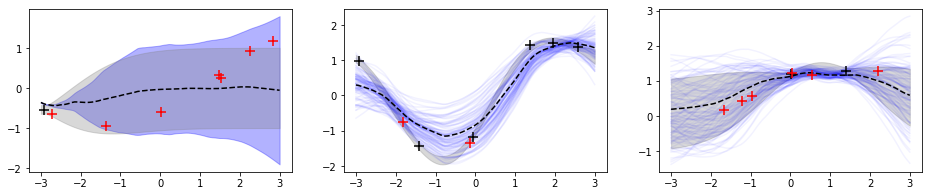


Epoch: 1901/1000000
Training        epoch 1900: 1.930e-01


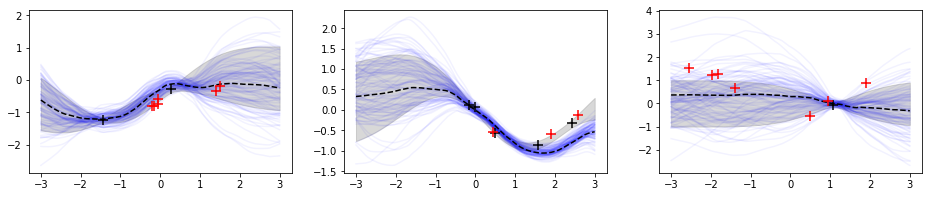


Epoch: 2001/1000000
Training        epoch 2000: 2.496e-01


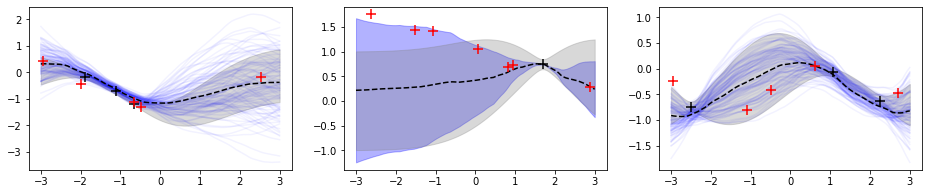


Epoch: 2101/1000000
Training        epoch 2100: 3.251e-02


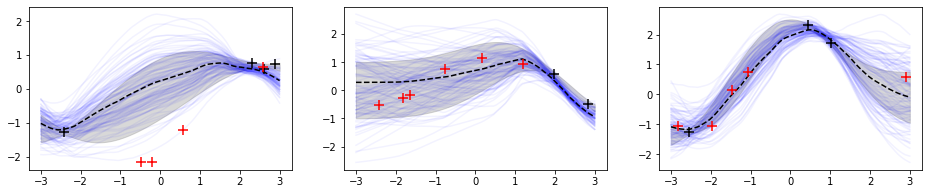


Epoch: 2201/1000000
Training        epoch 2200: 6.965e-02


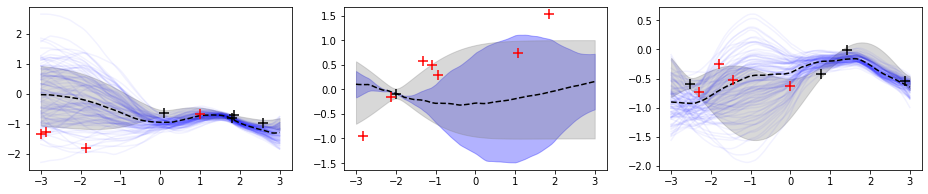


Epoch: 2301/1000000
Training        epoch 2300: 2.065e-01


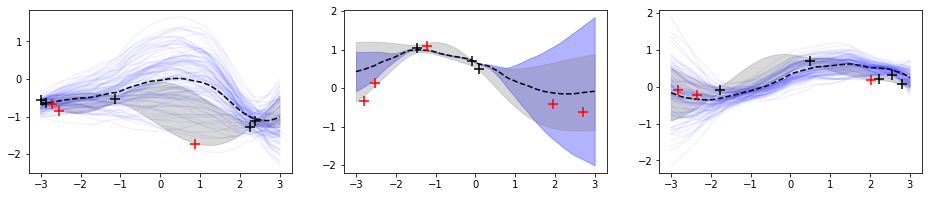


Epoch: 2401/1000000
Training        epoch 2400: 1.306e-01


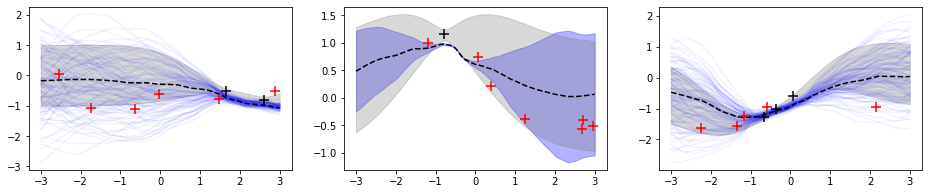


Epoch: 2501/1000000
Training        epoch 2500: 5.323e-02


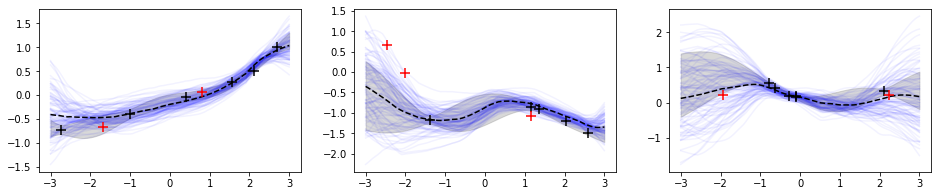


Epoch: 2601/1000000
Training        epoch 2600: 6.864e-02


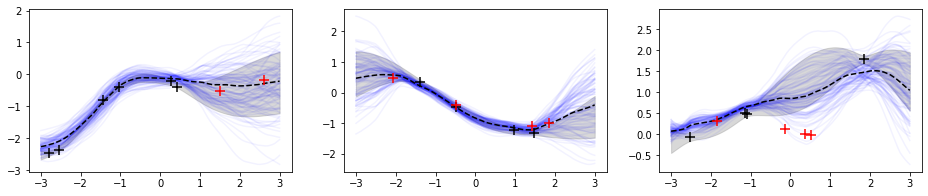


Epoch: 2701/1000000
Training        epoch 2700: 7.778e-02


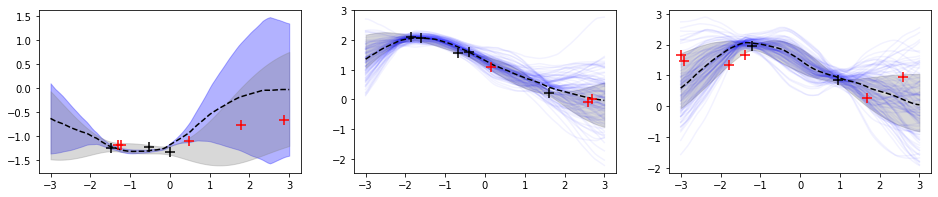


Epoch: 2801/1000000
Training        epoch 2800: 1.923e-01


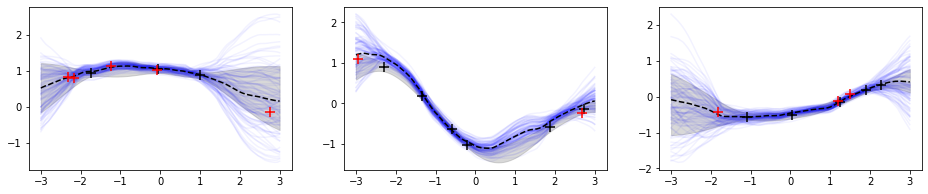


Epoch: 2901/1000000
Training        epoch 2900: 3.758e-02


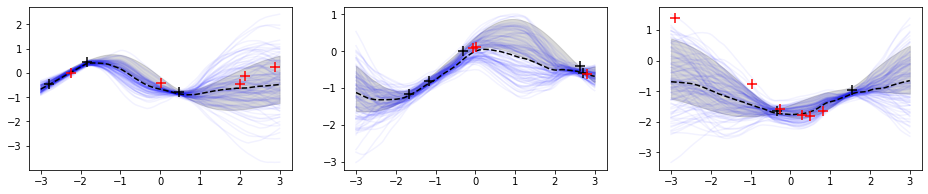


Epoch: 3001/1000000
Training        epoch 3000: -2.215e-02


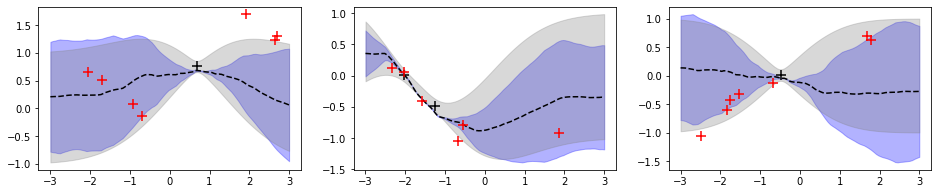


Epoch: 3101/1000000
Training        epoch 3100: -2.729e-02


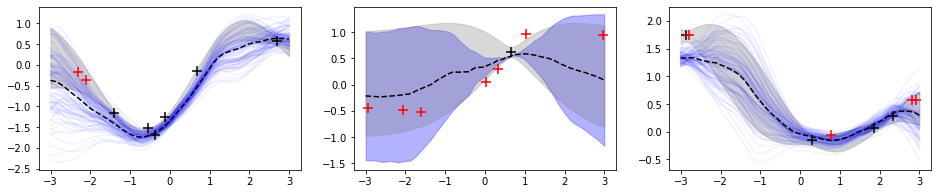


Epoch: 3201/1000000
Training        epoch 3200: 1.118e-02


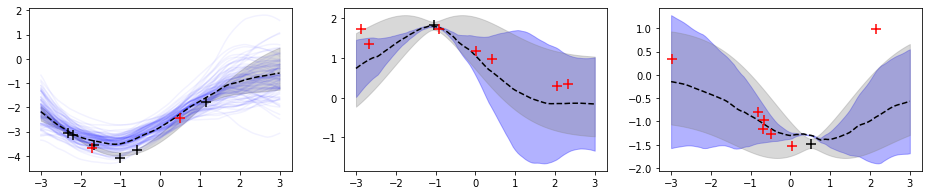


Epoch: 3301/1000000
Training        epoch 3300: 5.581e-02


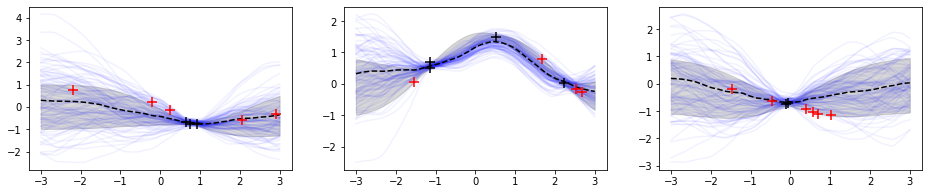


Epoch: 3401/1000000
Training        epoch 3400: -4.846e-02


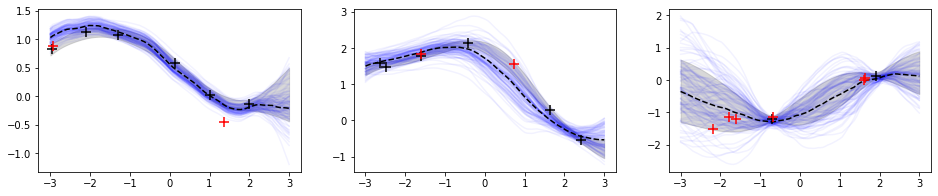


Epoch: 3501/1000000
Training        epoch 3500: 7.201e-02


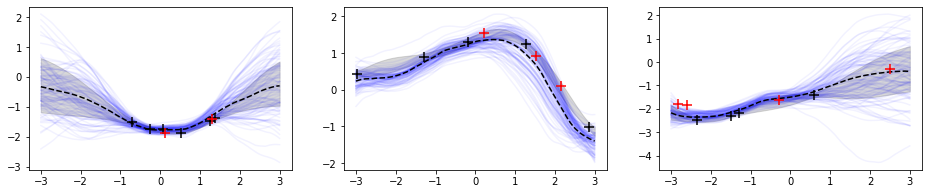


Epoch: 3601/1000000
Training        epoch 3600: 4.465e-03


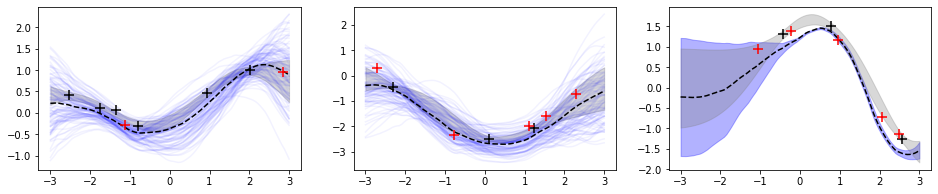


Epoch: 3701/1000000
Training        epoch 3700: 1.249e-02


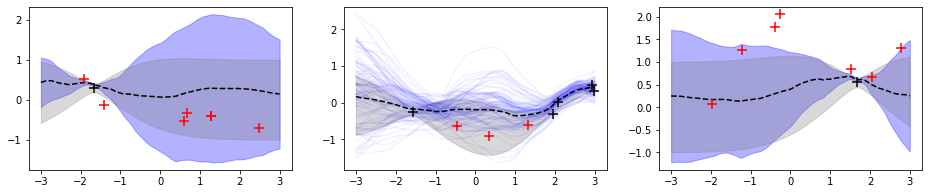


Epoch: 3801/1000000
Training        epoch 3800: -4.847e-02


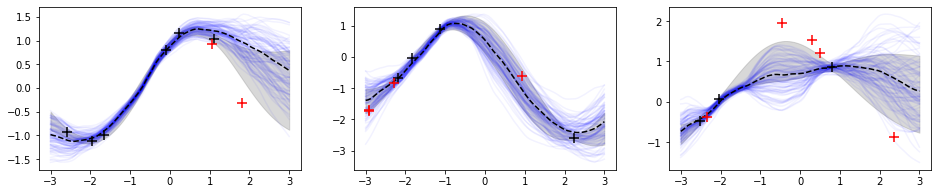


Epoch: 3901/1000000
Training        epoch 3900: -3.363e-02


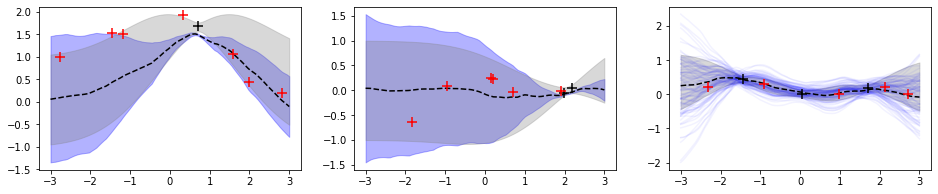


Epoch: 4001/1000000
Training        epoch 4000: -7.888e-02


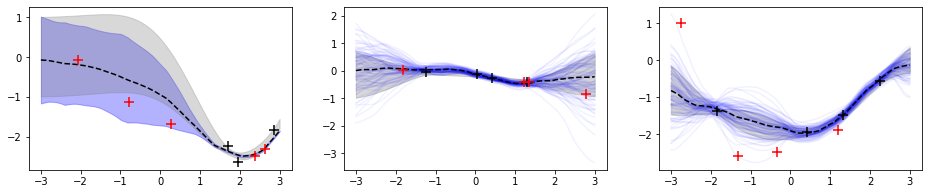


Epoch: 4101/1000000
Training        epoch 4100: -8.679e-02


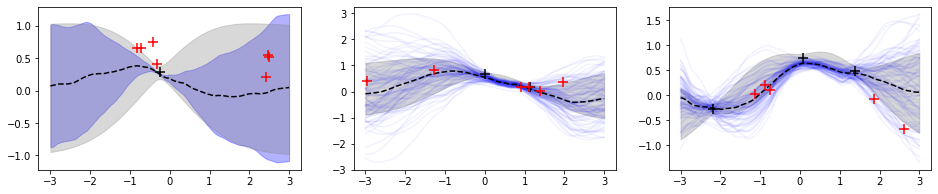


Epoch: 4201/1000000
Training        epoch 4200: -6.892e-02


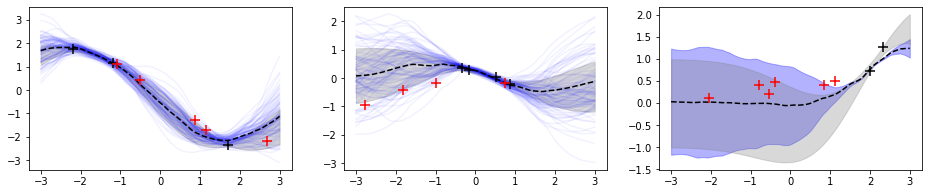


Epoch: 4301/1000000
Training        epoch 4300: -9.098e-02


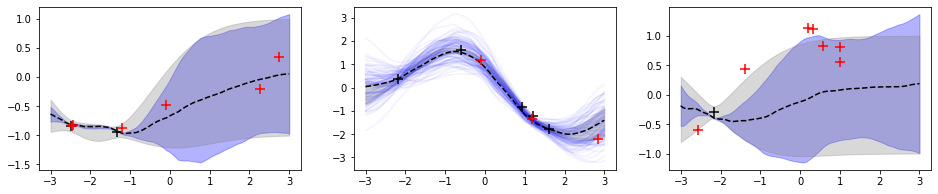


Epoch: 4401/1000000
Training        epoch 4400: -7.293e-02


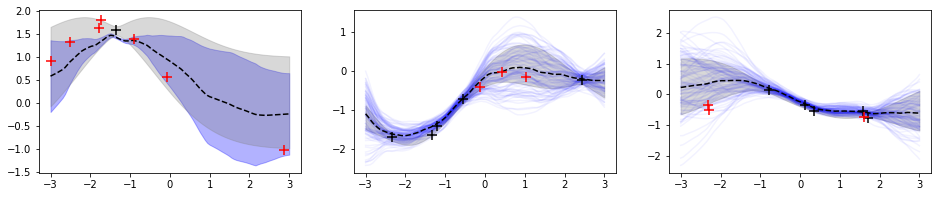


Epoch: 4501/1000000
Training        epoch 4500: -7.318e-02


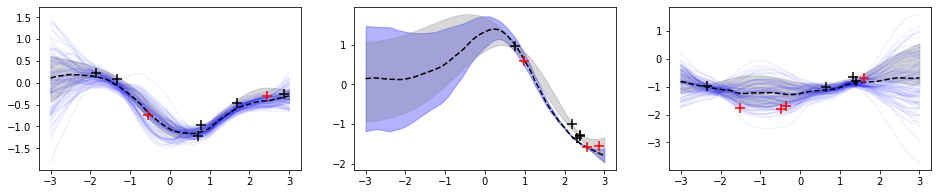


Epoch: 4601/1000000
Training        epoch 4600: -8.889e-02


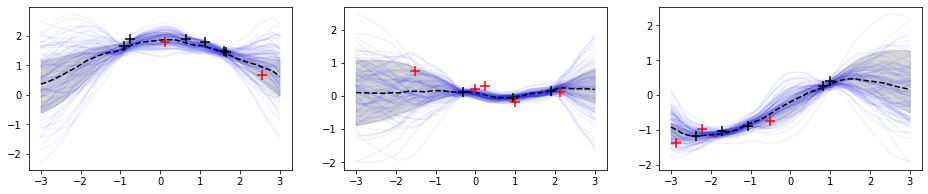


Epoch: 4701/1000000
Training        epoch 4700: -1.547e-01


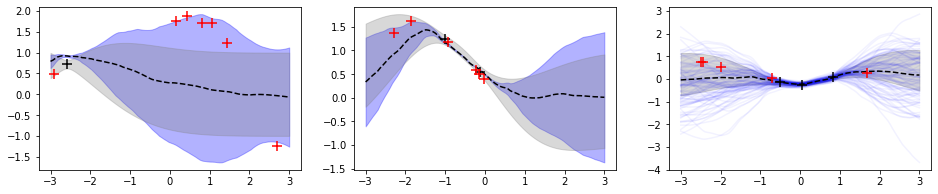


Epoch: 4801/1000000
Training        epoch 4800: -8.125e-02


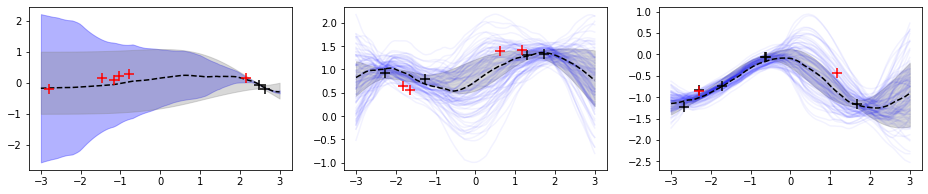


Epoch: 4901/1000000
Training        epoch 4900: -1.447e-01


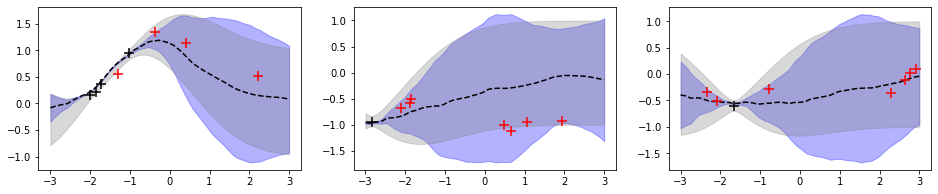


Epoch: 5001/1000000
Training        epoch 5000: -1.786e-01


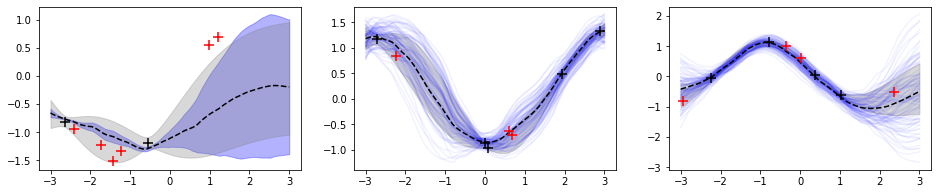


Epoch: 5101/1000000
Training        epoch 5100: -1.333e-01


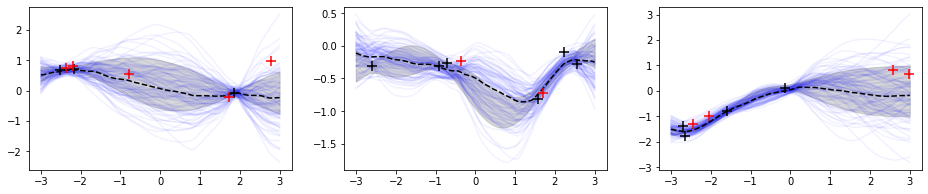


Epoch: 5201/1000000
Training        epoch 5200: -2.541e-02


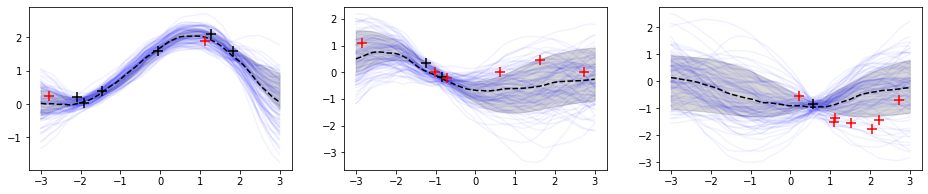


Epoch: 5301/1000000
Training        epoch 5300: -8.364e-02


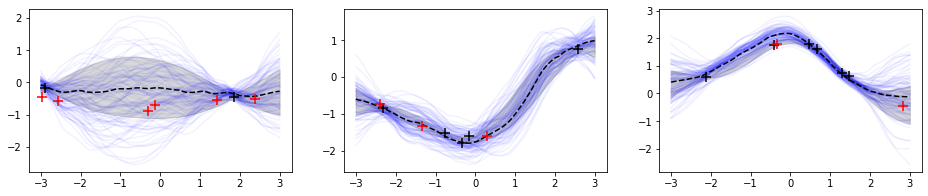


Epoch: 5401/1000000
Training        epoch 5400: -1.978e-01


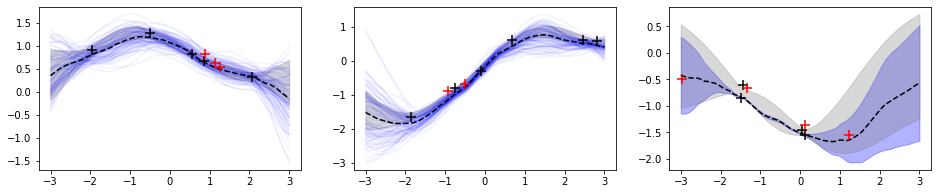


Epoch: 5501/1000000
Training        epoch 5500: -1.055e-01


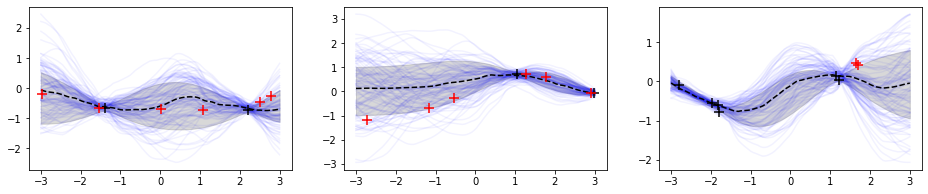


Epoch: 5601/1000000
Training        epoch 5600: -1.392e-01


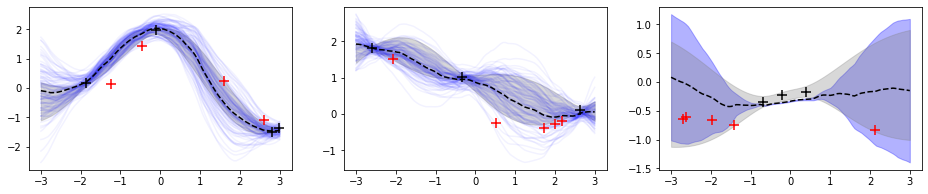


Epoch: 5701/1000000
Training        epoch 5700: -1.447e-01


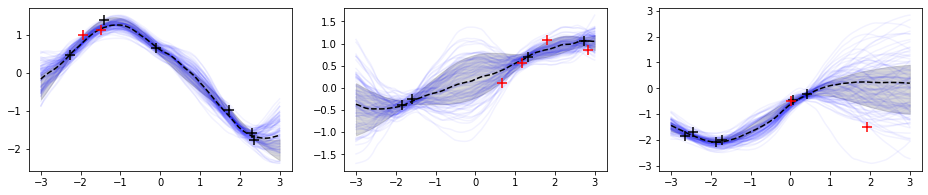


Epoch: 5801/1000000
Training        epoch 5800: -1.313e-01


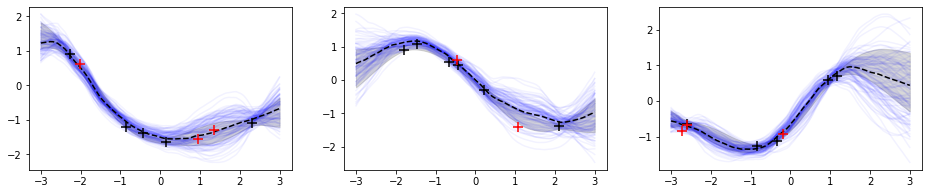


Epoch: 5901/1000000
Training        epoch 5900: -1.113e-01


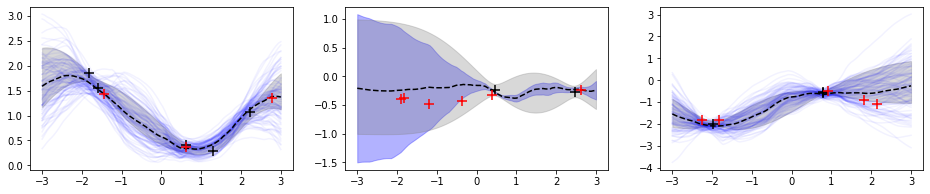


Epoch: 6001/1000000
Training        epoch 6000: -9.235e-02


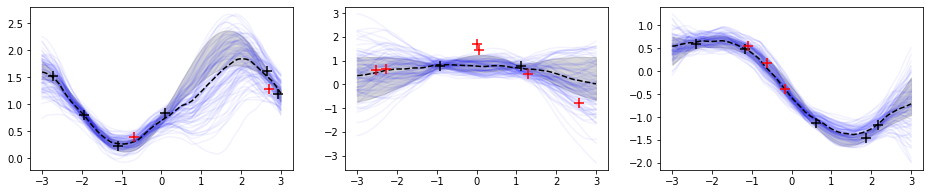


Epoch: 6101/1000000
Training        epoch 6100: -9.964e-02


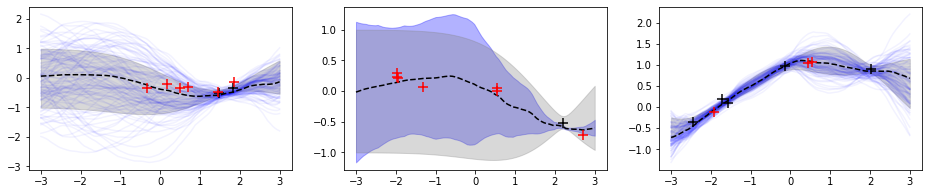


Epoch: 6201/1000000
Training        epoch 6200: -7.857e-02


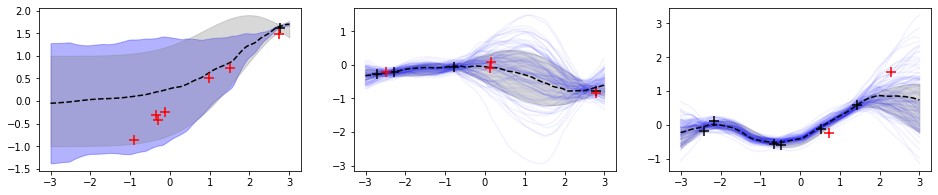


Epoch: 6301/1000000
Training        epoch 6300: -5.474e-02


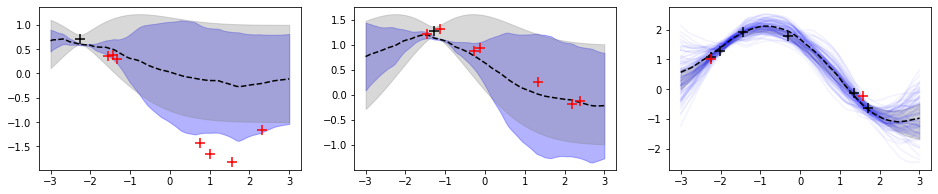


Epoch: 6401/1000000
Training        epoch 6400: -1.379e-01


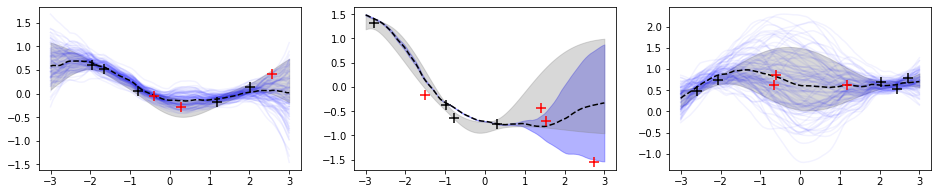


Epoch: 6501/1000000
Training        epoch 6500: -1.464e-01


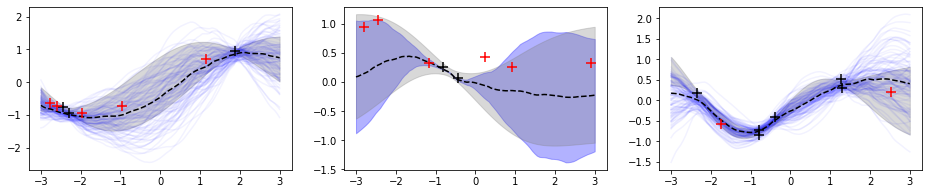


Epoch: 6601/1000000
Training        epoch 6600: -6.907e-02


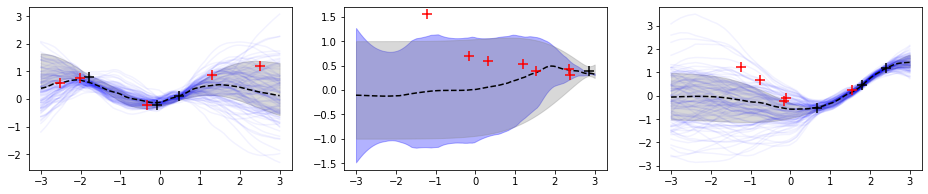


Epoch: 6701/1000000
Training        epoch 6700: -1.151e-01


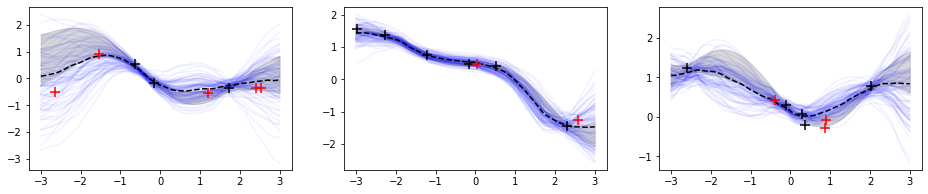


Epoch: 6801/1000000
Training        epoch 6800: -1.106e-01


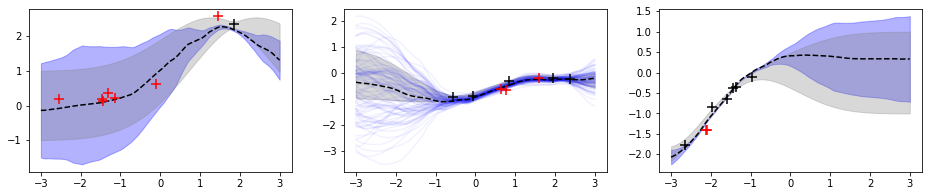


Epoch: 6901/1000000
Training        epoch 6900: -1.652e-01


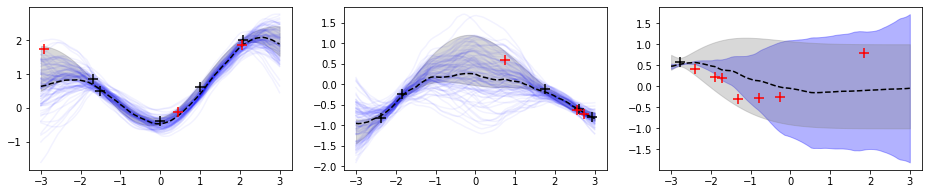


Epoch: 7001/1000000
Training        epoch 7000: -1.488e-01


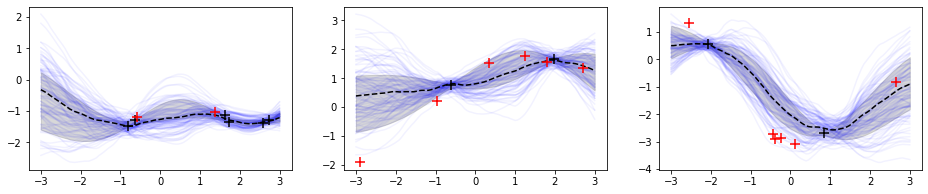


Epoch: 7101/1000000
Training        epoch 7100: -1.566e-01


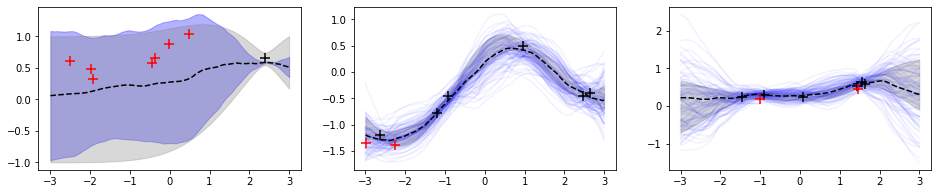


Epoch: 7201/1000000
Training        epoch 7200: -1.378e-01


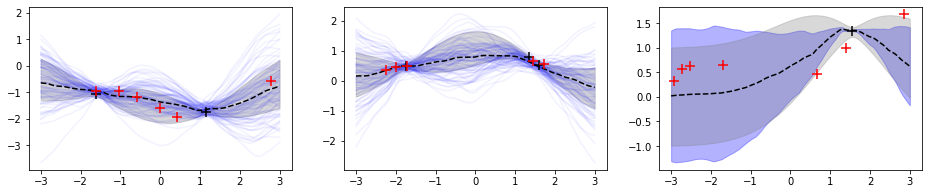


Epoch: 7301/1000000
Training        epoch 7300: -2.359e-02


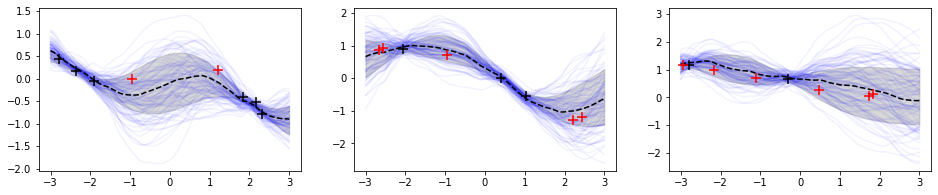


Epoch: 7401/1000000
Training        epoch 7400: -1.015e-01


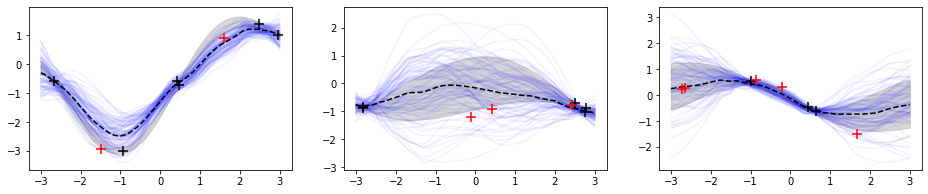


Epoch: 7501/1000000
Training        epoch 7500: -1.728e-01


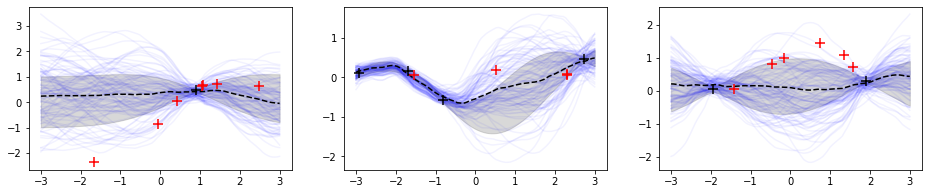


Epoch: 7601/1000000
Training        epoch 7600: -1.922e-01


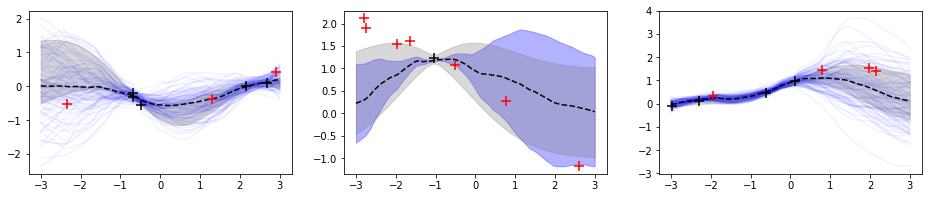


Epoch: 7701/1000000
Training        epoch 7700: -1.519e-01


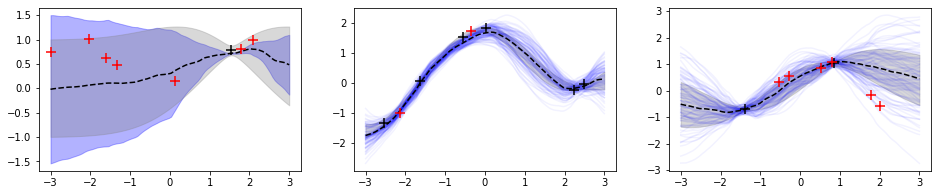


Epoch: 7801/1000000
Training        epoch 7800: -2.178e-01


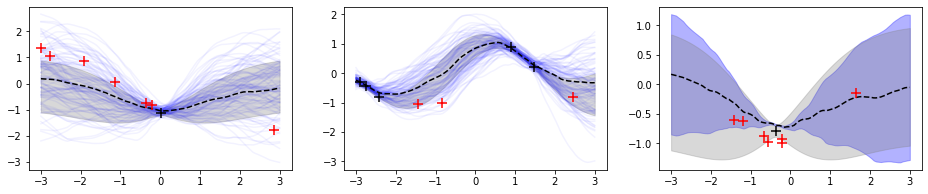


Epoch: 7901/1000000
Training        epoch 7900: -8.898e-02


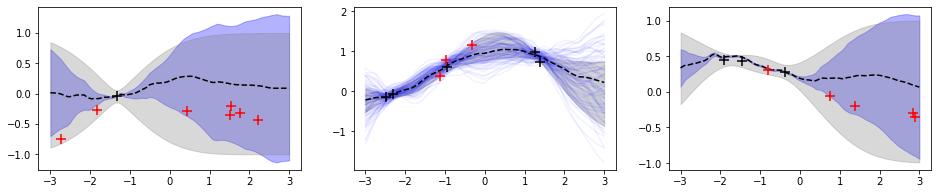


Epoch: 8001/1000000
Training        epoch 8000: -1.690e-01


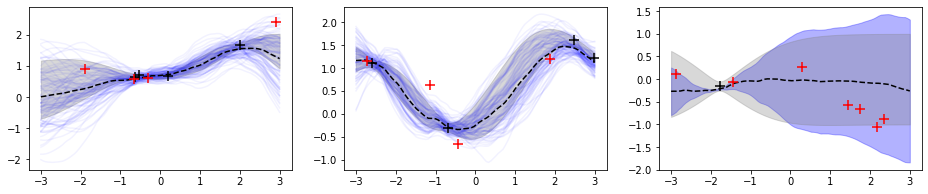


Epoch: 8101/1000000
Training        epoch 8100: -2.025e-01


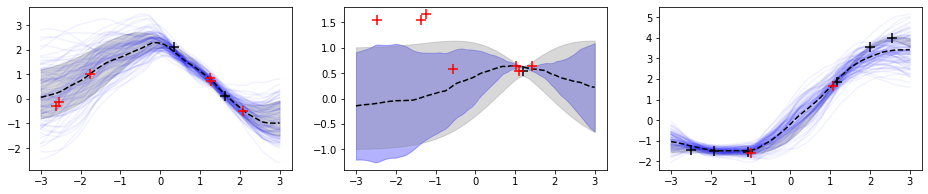


Epoch: 8201/1000000
Training        epoch 8200: -1.830e-01


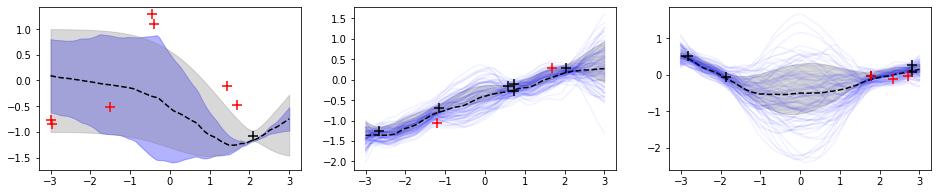


Epoch: 8301/1000000
Training        epoch 8300: -1.065e-01


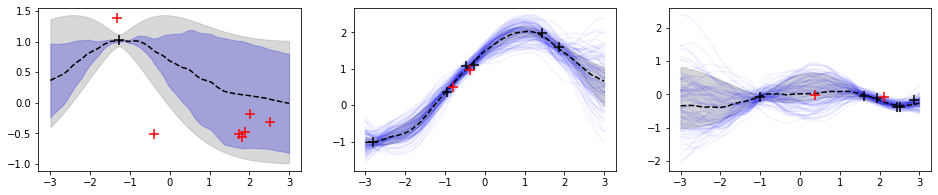


Epoch: 8401/1000000
Training        epoch 8400: -8.321e-02


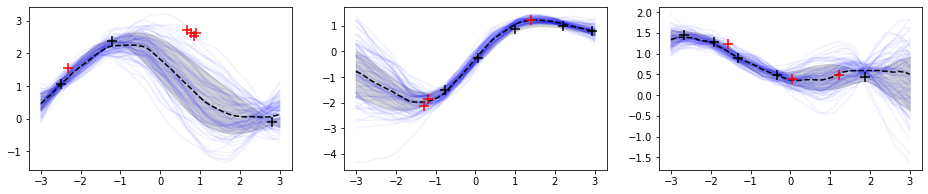


Epoch: 8501/1000000
Training        epoch 8500: -1.644e-01


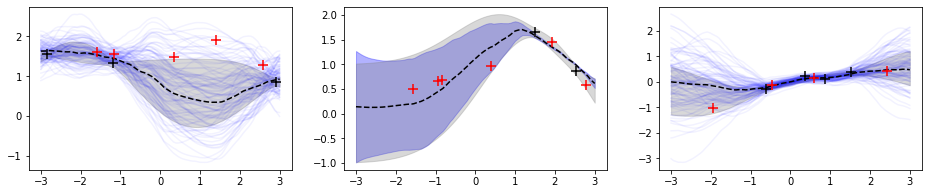


Epoch: 8601/1000000
Training        epoch 8600: -1.332e-01


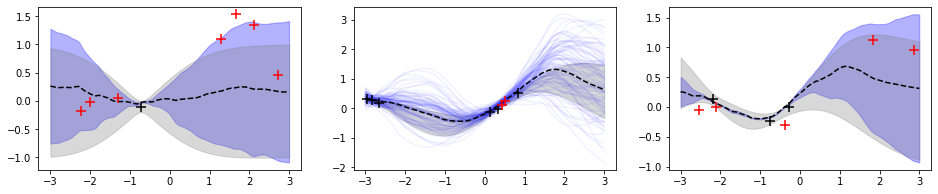


Epoch: 8701/1000000
Training        epoch 8700: -6.541e-02


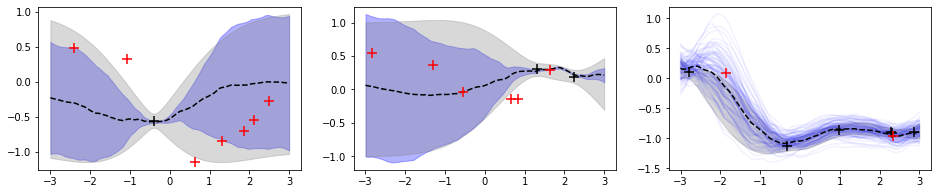


Epoch: 8801/1000000
Training        epoch 8800: -1.281e-01


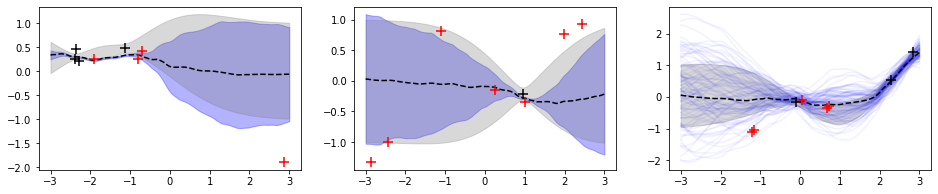


Epoch: 8901/1000000
Training        epoch 8900: -1.753e-01


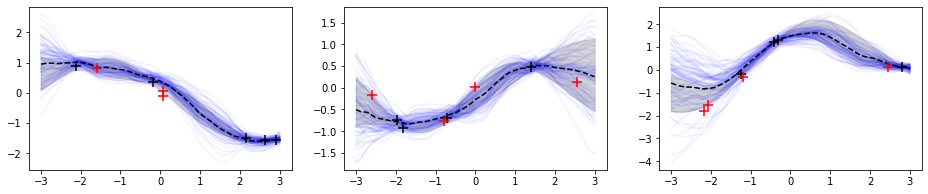


Epoch: 9001/1000000
Training        epoch 9000: -1.664e-01


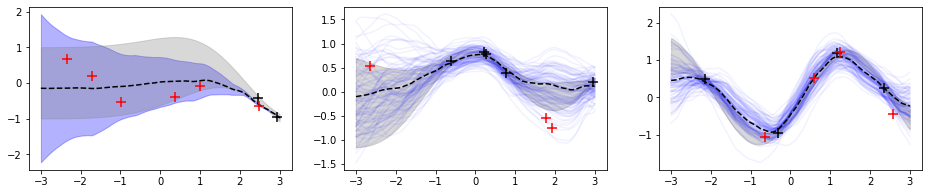


Epoch: 9101/1000000
Training        epoch 9100: -1.723e-01


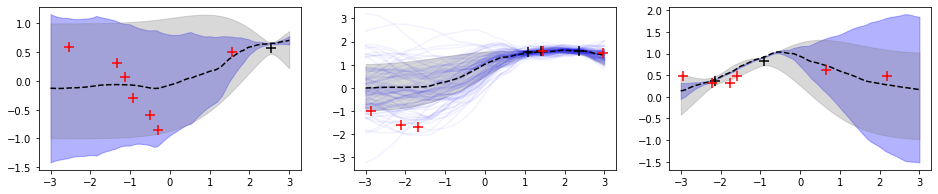


Epoch: 9201/1000000
Training        epoch 9200: -1.879e-01


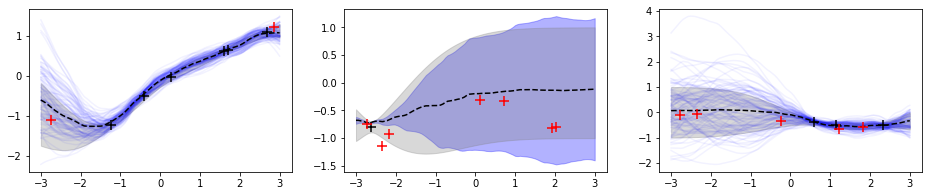


Epoch: 9301/1000000
Training        epoch 9300: -1.681e-01


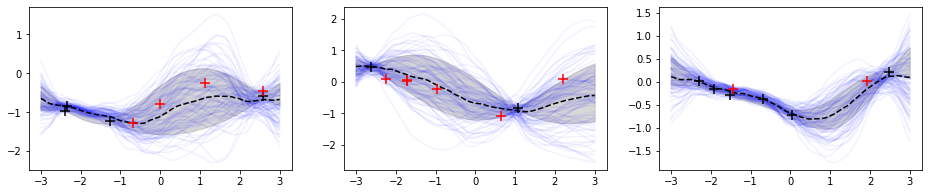


Epoch: 9401/1000000
Training        epoch 9400: -2.094e-01


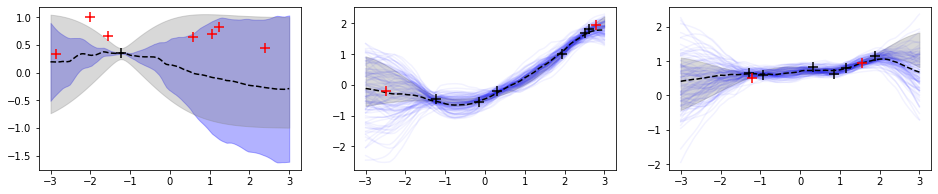


Epoch: 9501/1000000
Training        epoch 9500: -1.817e-01


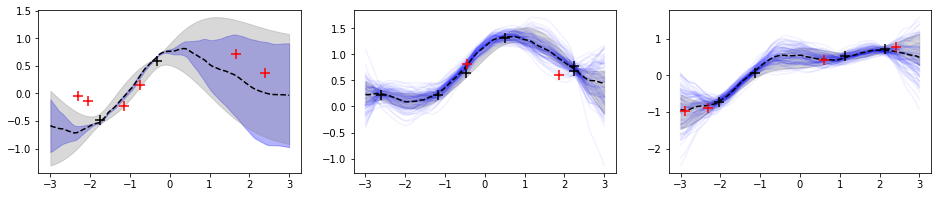


Epoch: 9601/1000000
Training        epoch 9600: -1.247e-01


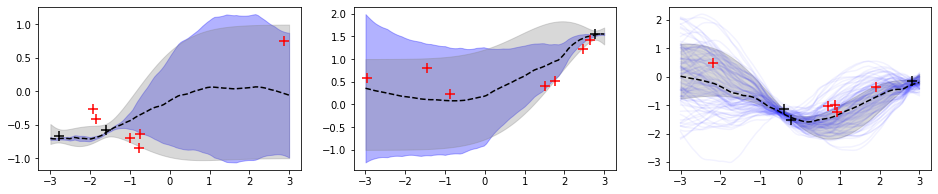


Epoch: 9701/1000000
Training        epoch 9700: -8.703e-02


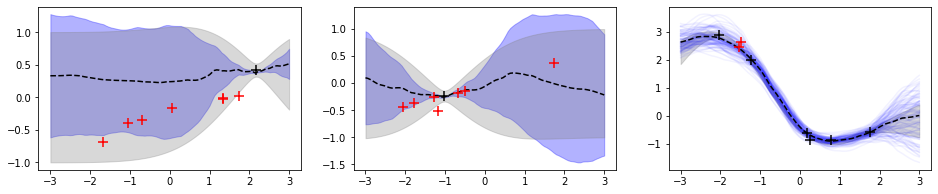


Epoch: 9801/1000000
Training        epoch 9800: -2.010e-01


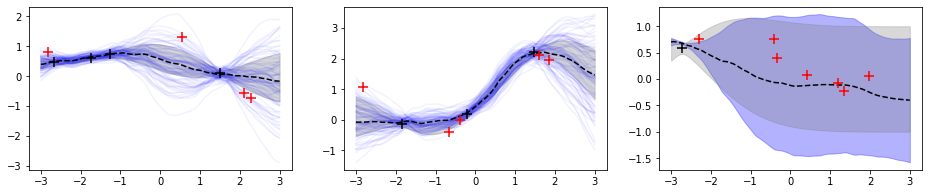


Epoch: 9901/1000000
Training        epoch 9900: -1.196e-01


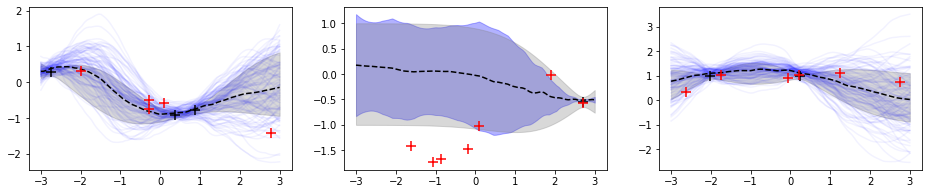


Epoch: 10001/1000000
Training        epoch 10000: -1.042e-01


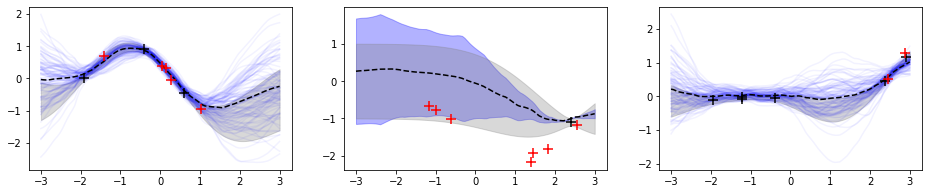


Epoch: 10101/1000000
Training        epoch 10100: -1.458e-01


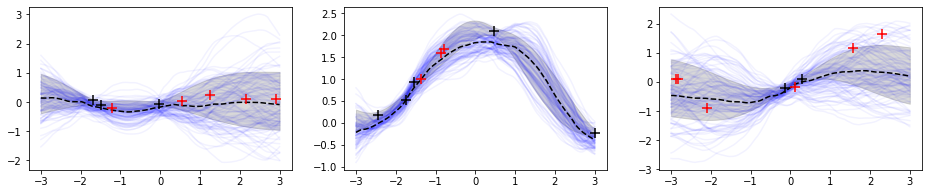


Epoch: 10201/1000000
Training        epoch 10200: -1.451e-01


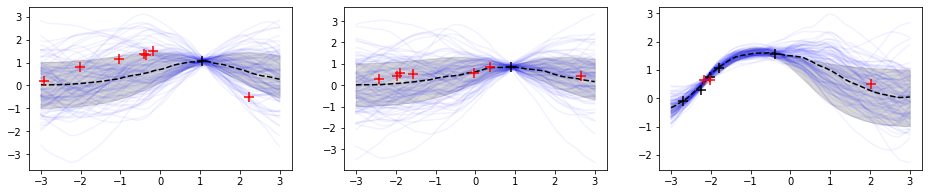


Epoch: 10301/1000000
Training        epoch 10300: -7.094e-02


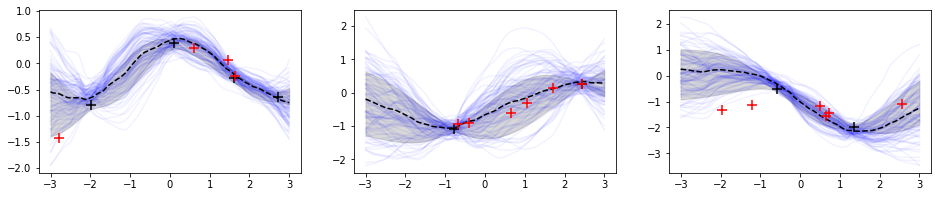


Epoch: 10401/1000000
Training        epoch 10400: -3.804e-02


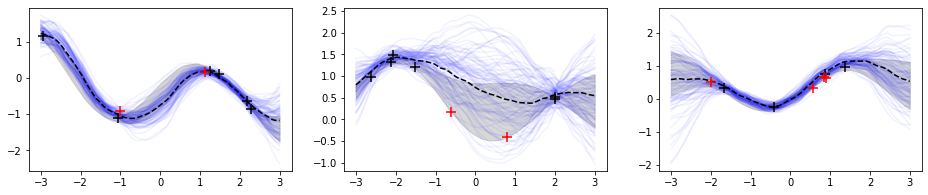


Epoch: 10501/1000000
Training        epoch 10500: -2.930e-01


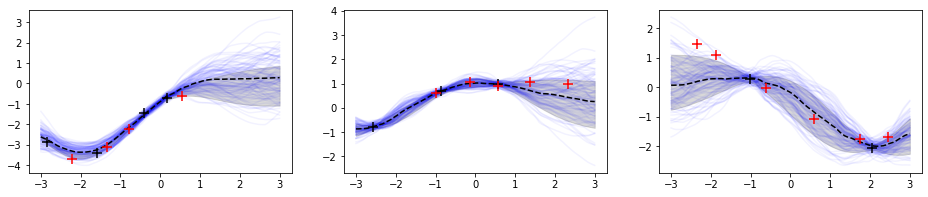


Epoch: 10601/1000000
Training        epoch 10600: -2.039e-01


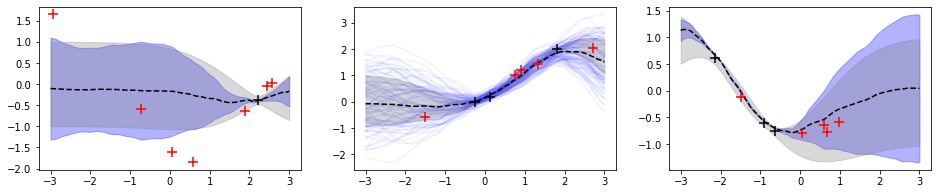


Epoch: 10701/1000000
Training        epoch 10700: -1.126e-01


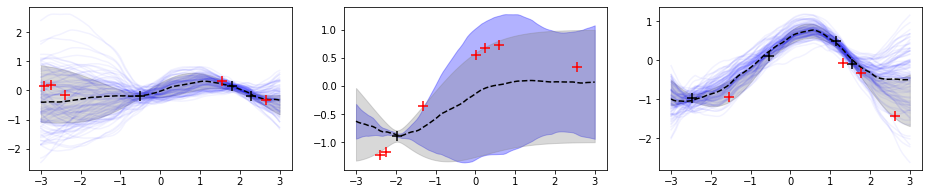


Epoch: 10801/1000000
Training        epoch 10800: -1.426e-01


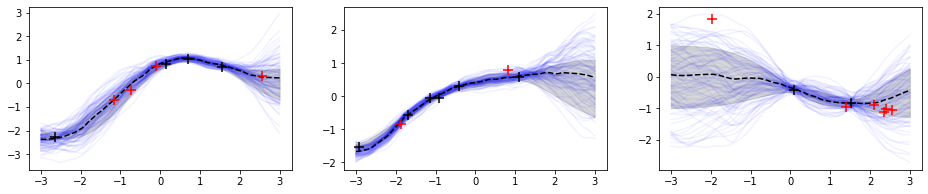


Epoch: 10901/1000000
Training        epoch 10900: -1.297e-01


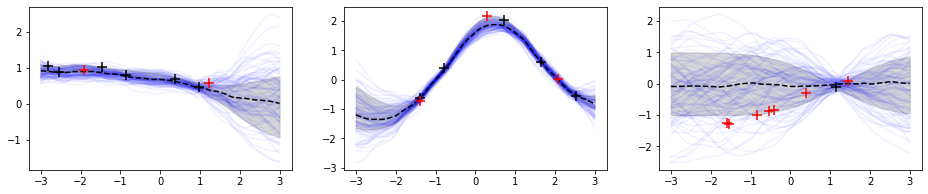


Epoch: 11001/1000000
Training        epoch 11000: -1.386e-01


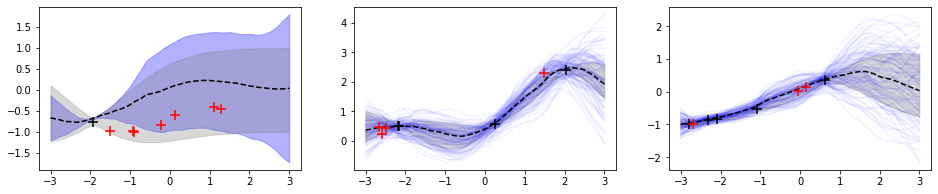


Epoch: 11101/1000000
Training        epoch 11100: -1.787e-01


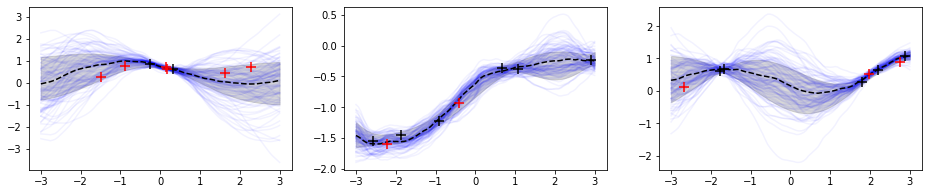


Epoch: 11201/1000000
Training        epoch 11200: -1.024e-01


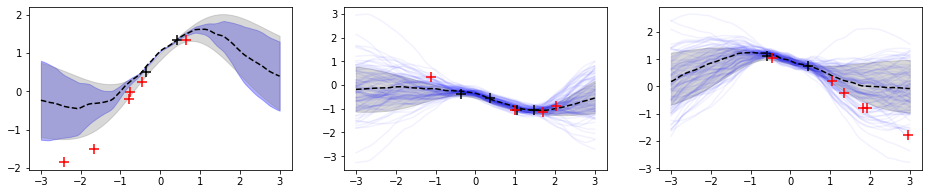


Epoch: 11301/1000000
Training        epoch 11300: -1.461e-01


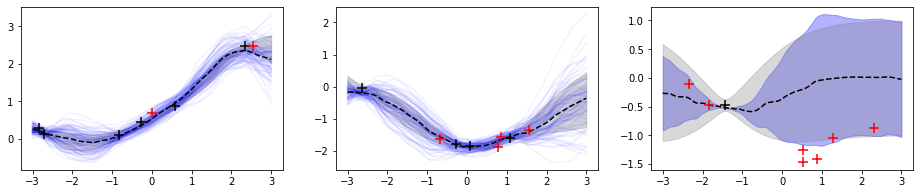


Epoch: 11401/1000000
Training        epoch 11400: -1.378e-01


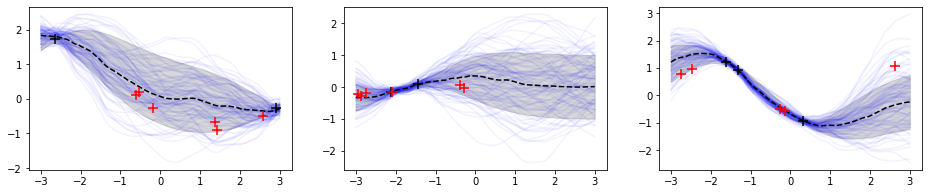


Epoch: 11501/1000000
Training        epoch 11500: -1.672e-01


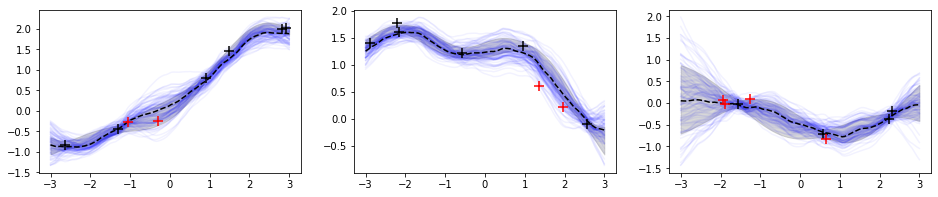


Epoch: 11601/1000000
Training        epoch 11600: -1.659e-01


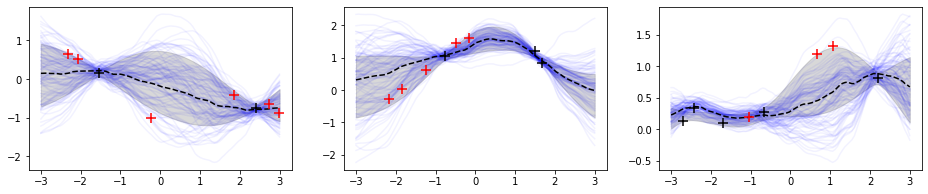


Epoch: 11701/1000000
Training        epoch 11700: -1.347e-01


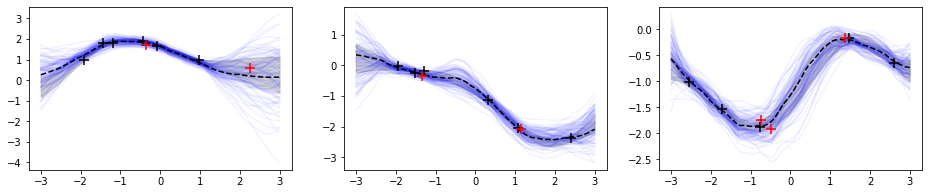


Epoch: 11801/1000000
Training        epoch 11800: -9.676e-02


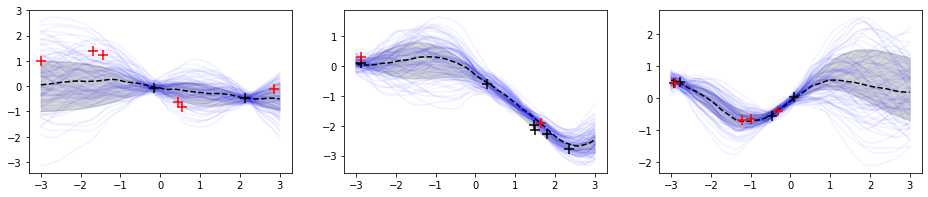


Epoch: 11901/1000000
Training        epoch 11900: -9.869e-02


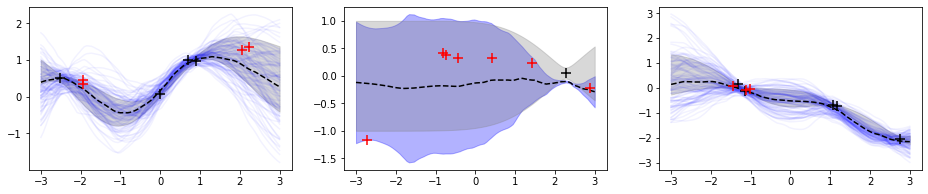


Epoch: 12001/1000000
Training        epoch 12000: -1.712e-01


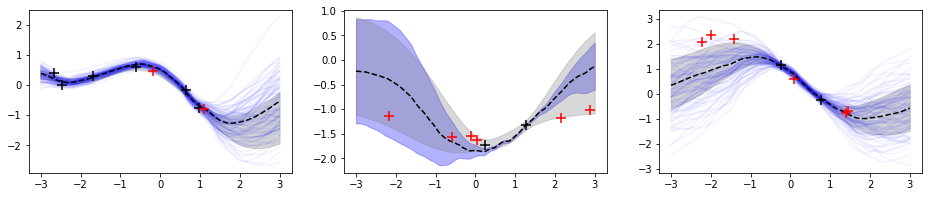


Epoch: 12101/1000000
Training        epoch 12100: -1.908e-01


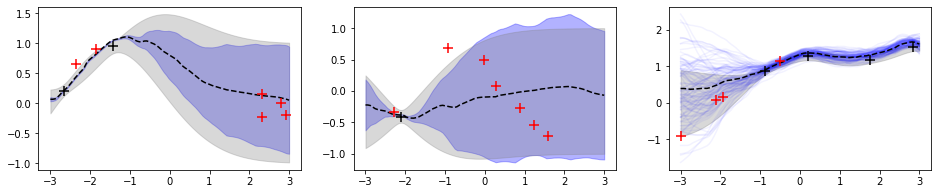


Epoch: 12201/1000000
Training        epoch 12200: -1.640e-01


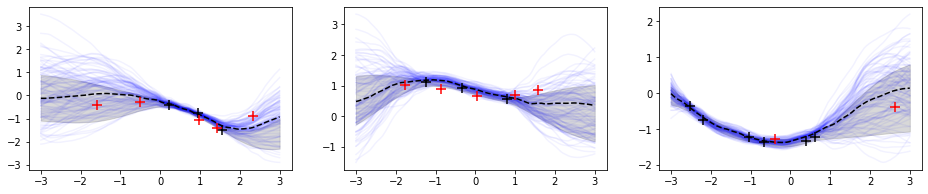


Epoch: 12301/1000000
Training        epoch 12300: -9.657e-02


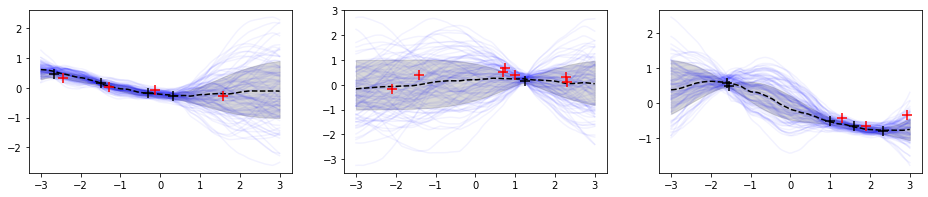


Epoch: 12401/1000000
Training        epoch 12400: -2.223e-01


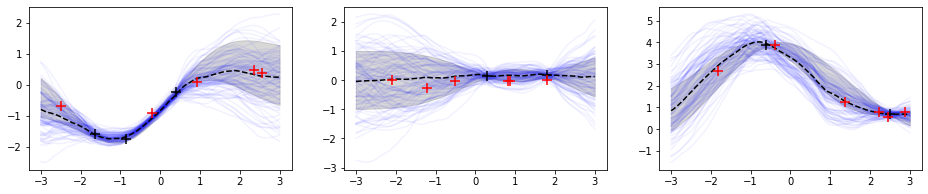


Epoch: 12501/1000000
Training        epoch 12500: -3.133e-01


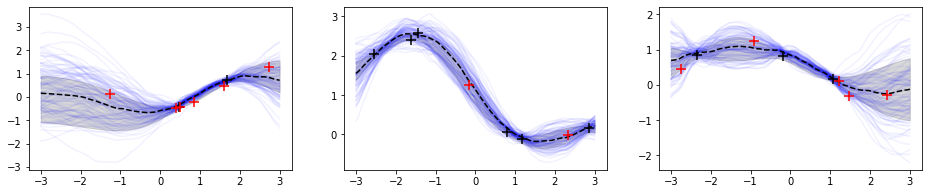


Epoch: 12601/1000000
Training        epoch 12600: -2.217e-01


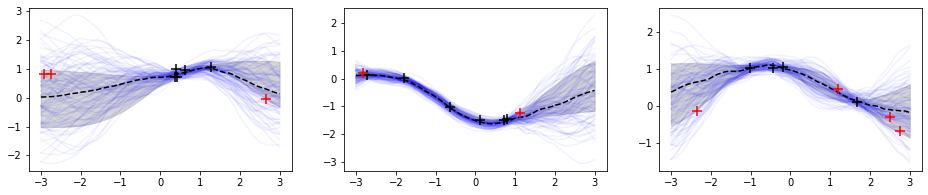


Epoch: 12701/1000000
Training        epoch 12700: -1.164e-01


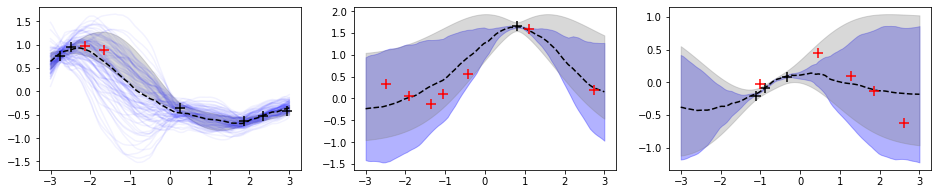


Epoch: 12801/1000000
Training        epoch 12800: -1.953e-01


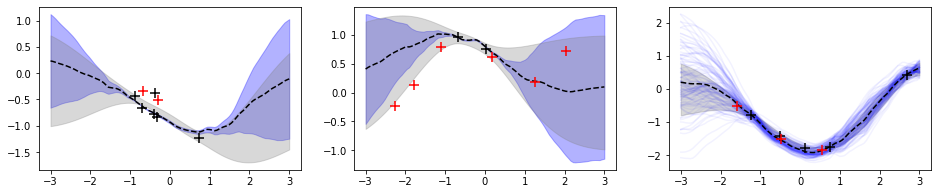


Epoch: 12901/1000000
Training        epoch 12900: -2.071e-01


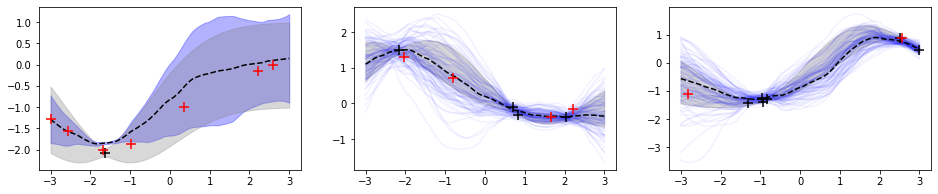


Epoch: 13001/1000000
Training        epoch 13000: -7.440e-02


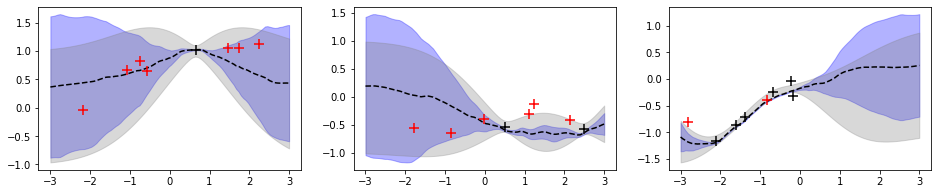


Epoch: 13101/1000000
Training        epoch 13100: -1.471e-01


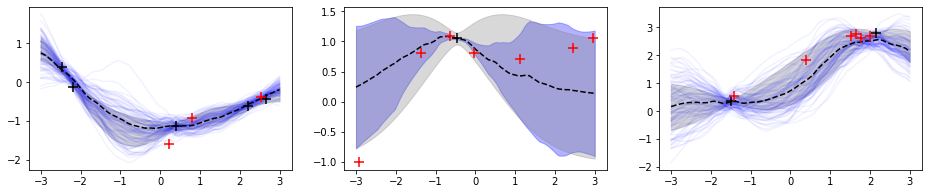


Epoch: 13201/1000000
Training        epoch 13200: -2.054e-01


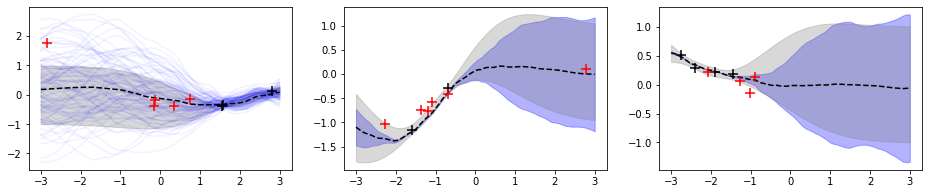


Epoch: 13301/1000000
Training        epoch 13300: -2.760e-01


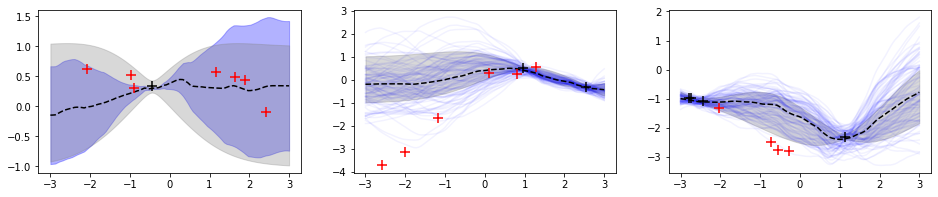


Epoch: 13401/1000000
Training        epoch 13400: -1.200e-01


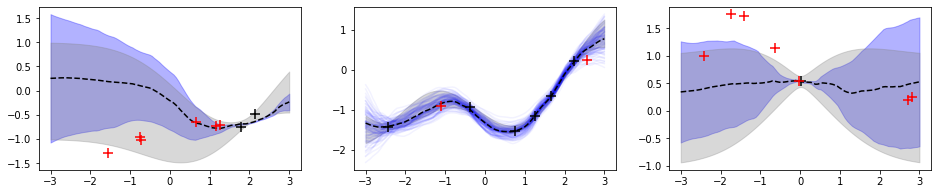

KeyboardInterrupt: 

In [15]:
torch.set_default_tensor_type(torch.FloatTensor)

cov = InnerProdCov(num_basis_dim)
noise = AddHomoNoise()

model = StandardFullyConnectedTEGNP(covariance=cov, add_noise=noise)

opt = torch.optim.Adam(model.parameters(), learning_rate)

for epoch in range(epochs):

    # Compute training objective
    train_obj = train(model,
                      opt,
                      xmin,
                      xmax,
                      num_batches,
                      batch_size,
                      scale,
                      cov_coeff,
                      noise_coeff,
                      num_samples)
    
    if epoch % int(1e2) == 0:
    
        print('\nEpoch: {}/{}'.format(epoch + 1, epochs))
        
        report_loss('Training', train_obj, f'epoch {epoch}')

        # Compute validation objective
#         val_obj, task = validate(gen_val, model, report_freq=num_valid_tasks)
#         report_loss('Validation', val_obj, f'epoch {epoch}')
        

        plot_samples_and_predictions(model,
                                     xmin=xmin,
                                     xmax=xmax,
                                     batch_size=plot_batch_size,
                                     scale=scale,
                                     cov_coeff=cov_coeff,
                                     noise_coeff=noise_coeff,
                                     step=epoch)






    
#     inputs, outputs = sample_datasets_from_gps(xmin,
#                                                xmax,
#                                                num_batches,
#                                                batch_size,
#                                                scale,
#                                                cov_coeff,
#                                                noise_coeff,
#                                                as_tensor=True)
    
#     loss = model.loss(inputs, outputs, num_samples=num_samples)
    
#     optimiser.zero_grad()
#     loss.backward()
#     optimiser.step()
    
#     if epoch % int(1e2) == 0:
        
#         print(loss)
        
#         plot_samples_and_predictions(model,
#                                      xmin,
#                                      xmax,
#                                      plot_batch_size,
#                                      scale,
#                                      cov_coeff,
#                                      noise_coeff,
#                                      epoch)